# Baseline Exploration: Spectral Traces Across Time

This notebook adds helper functions for plotting full-recording power, coherence, or Granger traces across time from an `LFPCollection`. The single-recording function accepts either a recording name or an `LFPRecording` object. The collection-level function applies the same plotting logic to every recording in the collection.


## Imports

These helpers expect the collection to already contain computed spectral arrays: `recording.power`, `recording.coherence`, or `recording.granger`.

In [2]:
import math
from itertools import combinations, permutations
import pickle
import lfp.lfp_analysis.LFP_collection as LFP_collection
import matplotlib.pyplot as plt
import numpy as np


c:\Users\zhaoz\miniforge3\envs\lfp_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# Reload the saved collection so downstream analysis does not need raw Trodes files.
collection=LFP_collection.LFPCollection.load_collection(r"D:\PadillaCoreanoLab\Coop_Ephys\D1_lfp_collection\lfp_collection.json")

In [4]:
def pickle_this(thing_to_pickle, file_name):
    """
    Pickles things
    Args (2):
        thing_to_pickle: anything you want to pickle
        file_name: str, filename that ends with .pkl
    Returns:
        none
    """
    with open(file_name, "wb") as file:
        pickle.dump(thing_to_pickle, file)
def unpickle_this(pickle_file):
    """
    Unpickles things
    Args (1):
        file_name: str, pickle filename that already exists and ends with .pkl
    Returns:
        pickled item
    """
    with open(pickle_file, "rb") as file:
        return pickle.load(file)

## Helper Functions

Both functions collapse the selected frequency range into a single time trace by averaging over frequency bins. The plots are separated by region: power creates one plot per brain region, coherence creates one plot per anchor region with all pairs involving that region, and Granger creates one plot per target region with incoming source-to-target traces.

In [5]:
def _resolve_recording(lfp_collection, recording):
    """Return an LFPRecording from a recording object or recording filename."""
    if hasattr(recording, "power") or hasattr(recording, "coherence") or hasattr(recording, "granger"):
        return recording

    if hasattr(lfp_collection, "get_recording"):
        return lfp_collection.get_recording(recording)

    matches = [rec for rec in lfp_collection.recordings if rec.name == recording]
    if not matches:
        raise ValueError(f"No recording named {recording!r} found in this LFPCollection.")
    return matches[0]


def _frequency_indices(recording, freq_range):
    """Convert an optional frequency range in Hz into indices for spectral arrays."""
    if not hasattr(recording, "frequencies"):
        raise AttributeError("Recording must have `frequencies`; run spectral calculations or load a processed collection first.")

    frequencies = np.asarray(recording.frequencies)
    if freq_range is None:
        return np.arange(len(frequencies)), f"{frequencies[0]:.1f}-{frequencies[-1]:.1f} Hz"

    low, high = freq_range
    freq_idx = np.where((frequencies >= low) & (frequencies <= high))[0]
    if freq_idx.size == 0:
        raise ValueError(f"No frequency bins found in range {freq_range} Hz.")
    return freq_idx, f"{low}-{high} Hz"


def _time_indices(recording, n_time_bins, time_window):
    """Convert an optional time window in seconds into spectral time-bin indices."""
    timestep = recording.timestep
    if time_window is None:
        start_idx, stop_idx = 0, n_time_bins
    else:
        start_s, stop_s = time_window
        if start_s < 0 or stop_s <= start_s:
            raise ValueError("time_window must be None or a tuple like (start_s, stop_s), with stop_s > start_s >= 0.")
        start_idx = max(0, math.floor(start_s / timestep))
        stop_idx = min(n_time_bins, math.ceil(stop_s / timestep))
        if start_idx >= n_time_bins:
            raise ValueError("time_window starts after the available spectral data.")

    time_axis = np.arange(start_idx, stop_idx) * timestep
    return start_idx, stop_idx, time_axis


def _region_labels(recording):
    """Return region names ordered by their array index."""
    return [recording.brain_region_dict.inverse[i] for i in range(len(recording.brain_region_dict))]


def _selected_regions(recording, regions=None, max_traces=None):
    """Return region names filtered by user selection and optional count cap."""
    region_names = _region_labels(recording)
    selected = region_names if regions is None else list(regions)

    missing = [region for region in selected if region not in recording.brain_region_dict]
    if missing:
        raise ValueError(f"Region(s) not found in recording {recording.name!r}: {missing}")

    if max_traces is not None:
        selected = selected[:max_traces]
    return selected


def _pair_indices(recording, mode, pairs=None):
    """Return region-pair indices and labels for coherence or Granger plotting."""
    region_dict = recording.brain_region_dict
    region_names = _region_labels(recording)

    if pairs is None:
        if mode == "coherence":
            pair_names = list(combinations(region_names, 2))
        else:
            pair_names = list(permutations(region_names, 2))
    else:
        pair_names = list(pairs)

    pair_indices = []
    pair_labels = []
    for first, second in pair_names:
        if first not in region_dict or second not in region_dict:
            raise ValueError(f"Pair {(first, second)!r} contains a region not found in {recording.name!r}.")
        i = region_dict[first]
        j = region_dict[second]
        pair_indices.append((i, j, first, second))
        if mode == "coherence":
            pair_labels.append(f"{first} & {second}")
        else:
            # In this codebase granger[:, :, target, source] means source -> target.
            pair_labels.append(f"{second} to {first}")
    return pair_indices, pair_labels


def _style_spectral_axis(ax, title, ylabel):
    """Apply shared plot styling for spectral trace axes."""
    ax.set_title(title)
    ax.set_xlabel("Time (s)")
    ax.set_ylabel(ylabel)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.legend(loc="center left", bbox_to_anchor=(1.02, 0.5), frameon=False)
    plt.tight_layout()


def plot_recording_spectral_traces(
    lfp_collection,
    recording,
    mode="power",
    time_window=None,
    freq_range=None,
    regions=None,
    pairs=None,
    max_traces=None,
    ax=None,
):
    """Plot power, coherence, or Granger traces across time for one recording.

    The function creates separate plots by region. For power, each plot contains
    one region trace. For coherence, each plot contains all selected pairs that
    include the anchor region. For Granger, each plot contains incoming
    source-to-target traces for one target region.

    Parameters
    ----------
    lfp_collection : LFPCollection
        Collection containing processed LFPRecording objects.
    recording : str or LFPRecording
        Recording filename, e.g. `20250517_..._merged.rec`, or an LFPRecording object.
    mode : {'power', 'coherence', 'granger'}
        Spectral measure to plot.
    time_window : tuple[float, float] or None
        Optional `(start_s, stop_s)` window in seconds. If None, plot the entire recording.
    freq_range : tuple[float, float] or None
        Optional `(low_hz, high_hz)` frequency range to average over. If None, average over all frequency bins.
    regions : list[str] or None
        Region plots to create. For Granger, these are target regions. If None, plot all regions.
    pairs : list[tuple[str, str]] or None
        Coherence/Granger subset of region pairs. For Granger, each tuple is interpreted as `(target, source)`.
    max_traces : int or None
        Optional cap on the number of region plots for power, or lines per region plot for coherence/Granger.
    ax : matplotlib.axes.Axes or None
        Optional axis for the special case where exactly one plot is produced. Leave as None for normal multi-plot output.

    Returns
    -------
    list[matplotlib.axes.Axes]
        Axes containing the generated region-separated plots.
    """
    mode = mode.lower()
    if mode not in {"power", "coherence", "granger"}:
        raise ValueError("mode must be 'power', 'coherence', or 'granger'.")

    recording = _resolve_recording(lfp_collection, recording)
    if not hasattr(recording, mode):
        raise AttributeError(f"Recording {recording.name!r} does not have `{mode}`. Calculate or load it first.")

    values = getattr(recording, mode)
    freq_idx, freq_label = _frequency_indices(recording, freq_range)
    start_idx, stop_idx, time_axis = _time_indices(recording, values.shape[0], time_window)
    axes = []

    if mode == "power":
        selected_regions = _selected_regions(recording, regions=regions, max_traces=max_traces)
        if ax is not None and len(selected_regions) != 1:
            raise ValueError("ax can only be supplied when exactly one power region will be plotted.")

        for region in selected_regions:
            region_idx = recording.brain_region_dict[region]
            trace = np.nanmean(values[start_idx:stop_idx][:, freq_idx, region_idx], axis=1)
            current_ax = ax if ax is not None else plt.subplots(figsize=(12, 4))[1]
            current_ax.plot(time_axis, trace, label=region)
            _style_spectral_axis(
                current_ax,
                title=f"{recording.name}\n{region} {mode.title()} over time ({freq_label})",
                ylabel=mode.title(),
            )
            axes.append(current_ax)
        return axes

    selected_anchor_regions = _selected_regions(recording, regions=regions, max_traces=None)
    pair_indices, pair_labels = _pair_indices(recording, mode, pairs=pairs)
    if ax is not None and len(selected_anchor_regions) != 1:
        raise ValueError("ax can only be supplied when exactly one region-specific plot will be produced.")

    for anchor_region in selected_anchor_regions:
        anchor_idx = recording.brain_region_dict[anchor_region]
        traces_for_anchor = []
        for pair_info, label in zip(pair_indices, pair_labels):
            first_idx, second_idx, first_region, second_region = pair_info
            if mode == "coherence":
                if anchor_region not in {first_region, second_region}:
                    continue
            else:
                if first_idx != anchor_idx:
                    continue

            trace = np.nanmean(values[start_idx:stop_idx][:, freq_idx, first_idx, second_idx], axis=1)
            traces_for_anchor.append((trace, label))

        if max_traces is not None:
            traces_for_anchor = traces_for_anchor[:max_traces]
        if not traces_for_anchor:
            continue

        current_ax = ax if ax is not None else plt.subplots(figsize=(12, 5))[1]
        for trace, label in traces_for_anchor:
            current_ax.plot(time_axis, trace, label=label)

        title_region = f"{anchor_region}" if mode == "coherence" else f"target {anchor_region}"
        _style_spectral_axis(
            current_ax,
            title=f"{recording.name}\n{title_region} {mode.title()} over time ({freq_label})",
            ylabel=mode.title(),
        )
        axes.append(current_ax)

    return axes


def plot_collection_spectral_traces(
    lfp_collection,
    mode="power",
    time_window=None,
    freq_range=None,
    regions=None,
    pairs=None,
    max_traces=None,
):
    """Plot power, coherence, or Granger traces across time for every recording.

    Parameters are the same as `plot_recording_spectral_traces()`, except no specific
    recording is supplied. Multiple region-separated figures are created per recording.

    Returns
    -------
    list[matplotlib.axes.Axes]
        Axes for all generated region-separated recording plots.
    """
    axes = []
    for recording in lfp_collection.recordings:
        recording_axes = plot_recording_spectral_traces(
            lfp_collection=lfp_collection,
            recording=recording,
            mode=mode,
            time_window=time_window,
            freq_range=freq_range,
            regions=regions,
            pairs=pairs,
            max_traces=max_traces,
        )
        axes.extend(recording_axes)
    return axes

## Example Usage

These examples assume `collection` has already been loaded and contains computed spectral arrays. `freq_range` is in Hz, and `time_window` is in seconds. Each call returns a list of axes because the functions create separate plots for each requested region.

C:\Users\zhaoz\AppData\Local\Temp\ipykernel_41452\3670429833.py:172: RuntimeWarning: Mean of empty slice
  trace = np.nanmean(values[start_idx:stop_idx][:, freq_idx, region_idx], axis=1)
C:\Users\zhaoz\AppData\Local\Temp\ipykernel_41452\3670429833.py:200: RuntimeWarning: Mean of empty slice
  trace = np.nanmean(values[start_idx:stop_idx][:, freq_idx, first_idx, second_idx], axis=1)
C:\Users\zhaoz\AppData\Local\Temp\ipykernel_41452\3670429833.py:208: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  current_ax = ax if ax is not None else plt.subplots(figsize=(12, 5))[1]


[<Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\nmPFC Coherence over time (12-20 Hz)'}, xlabel='Time (s)', ylabel='Coherence'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\nNAc Coherence over time (12-20 Hz)'}, xlabel='Time (s)', ylabel='Coherence'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\nBLA Coherence over time (12-20 Hz)'}, xlabel='Time (s)', ylabel='Coherence'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-3_merged.rec\nmPFC Coherence over time (12-20 Hz)'}, xlabel='Time (s)', ylabel='Coherence'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-3_merged.rec\nNAc Coherence over time (12-20 Hz)'}, xlabel='Time (s)', ylabel='Coherence'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-3_merged.rec\nBLA Coherence over time (12-20 Hz)'}, xlabel='Time (s)', ylabel='Coherence'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_2-1_merged.rec\nmPFC Coherence over time (12-20 Hz)'}, xlabel='Time (s

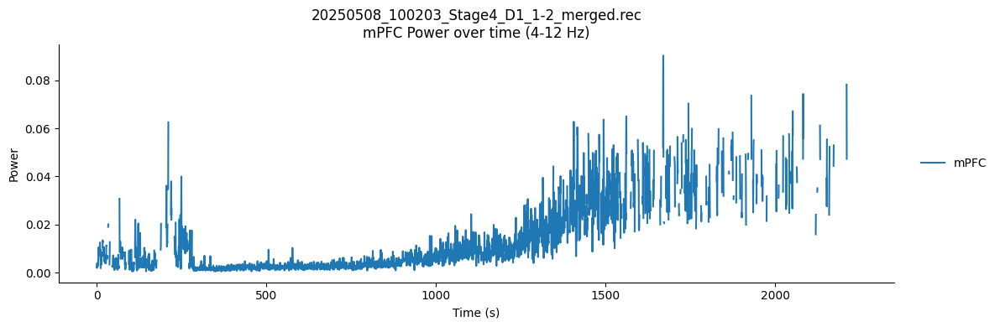

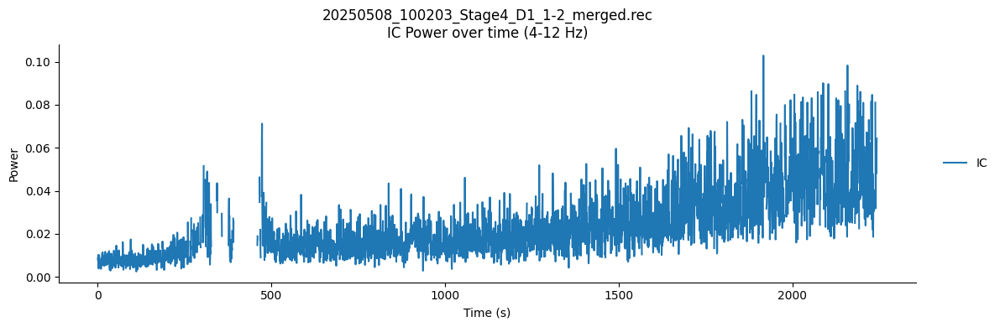

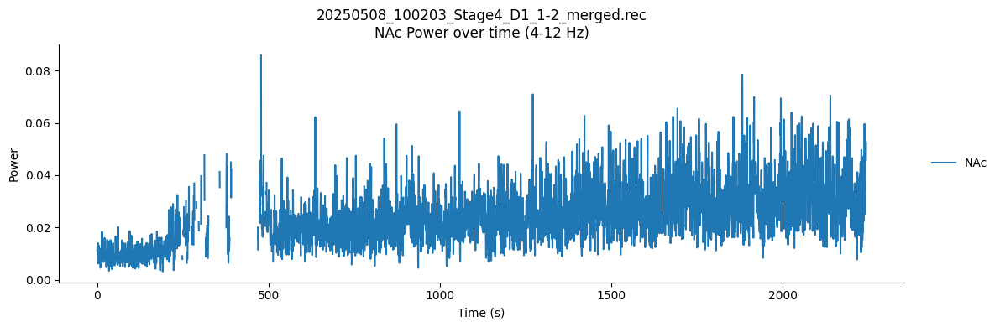

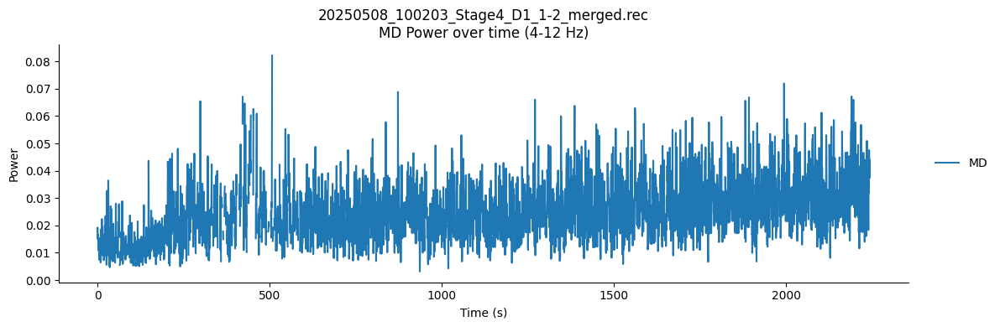

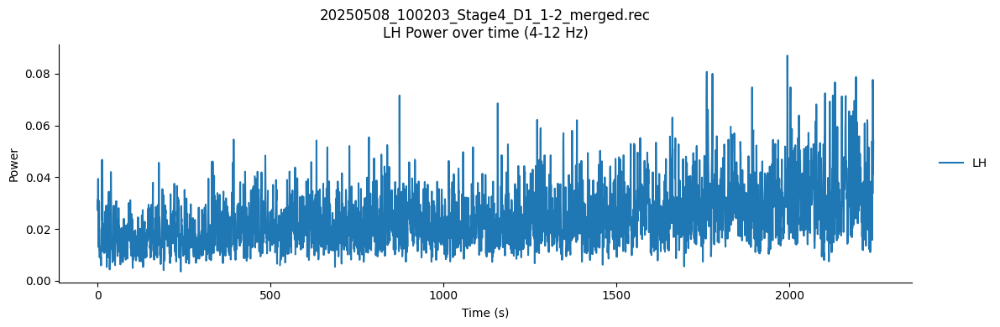

...

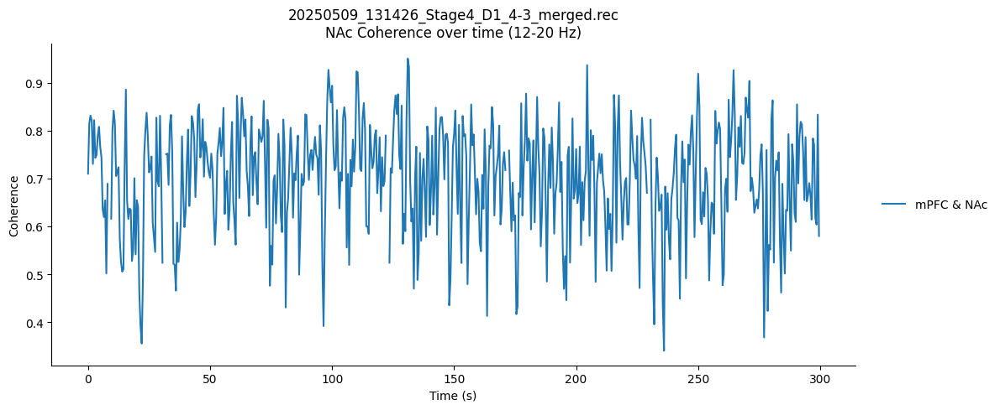

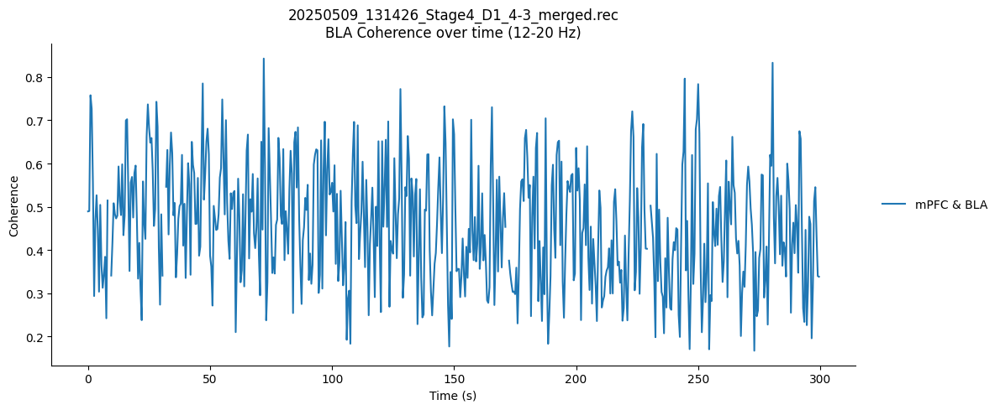

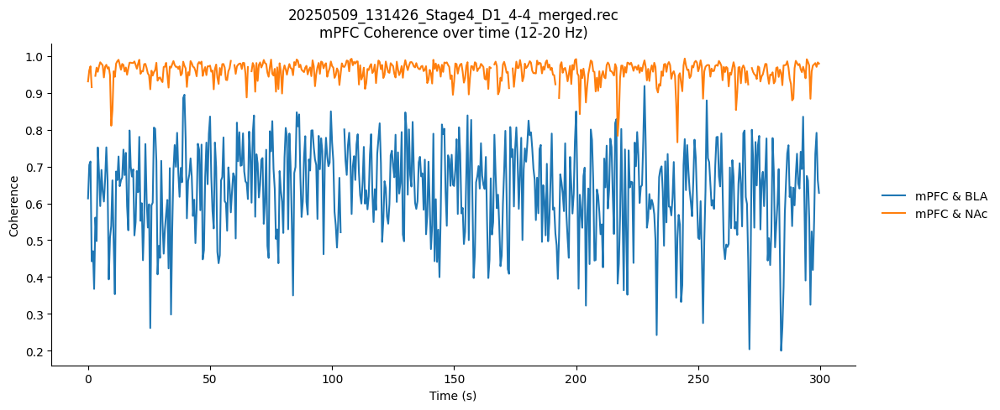

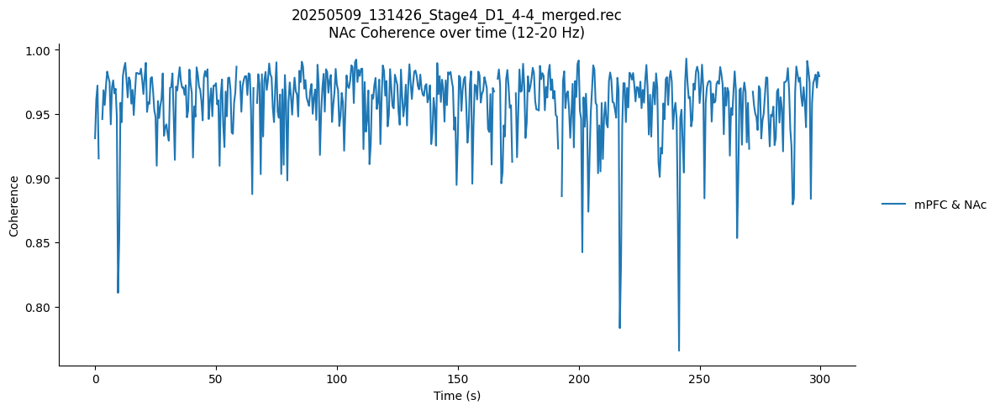

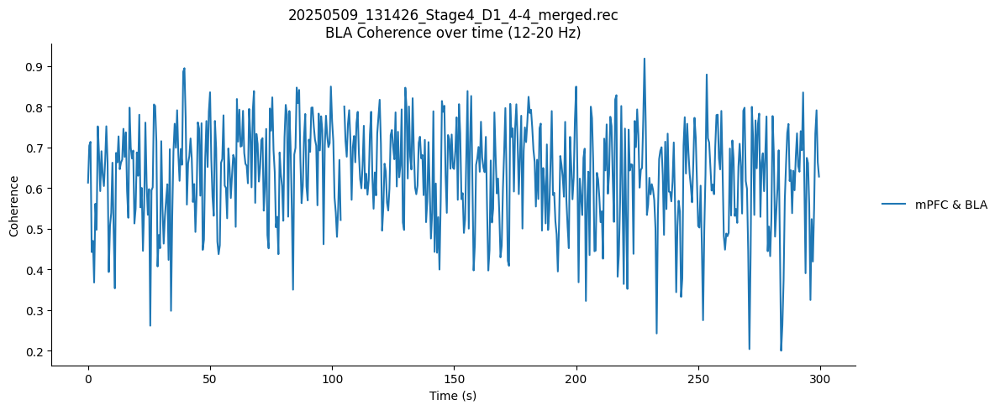

In [28]:
# Plot theta-band power across the full recording for one recording by name.
# This returns one axis per selected region.
plot_recording_spectral_traces(
    collection,
    recording="20250508_100203_Stage4_D1_1-2_merged.rec",
    mode="power",
    freq_range=(4, 12),
)

# Plot coherence for selected pairs in the first 5 minutes of every recording.
# This returns separate region-specific plots for each recording.
plot_collection_spectral_traces(
    collection,
    mode="coherence",
    time_window=(0, 300),
    freq_range=(12, 20),
    pairs=[("mPFC", "BLA"), ("mPFC", "NAc")],
)

# Plot a small number of incoming Granger traces per target region.
# plot_recording_spectral_traces(
#     collection,
#     recording=collection.recordings[0],
#     mode="granger",
#     freq_range=(13, 30),
#     max_traces=8,
# )

In [7]:
def find_iti_windows(behaviors, window_duration=2.0, time_bounds=None, stage=None, day=None):
    """
    Count or print non-overlapping ITI windows.

    ITI windows are defined as periods where no behavioral events occur.
    Overlapping events are merged before gap detection.

    Parameters:
        behaviors (list or dict): Either an entire stage list shaped like
            [{recording_name: {behavior_name: events}}, ...], one day dictionary
            shaped like {recording_name: {behavior_name: events}}, or one
            recording dictionary shaped like {behavior_name: events}.
        window_duration (float): Duration of ITI window to find. The default is
            2.0 seconds.
        time_bounds (tuple): Recording time bounds (min_time, max_time). If None,
            uses the data range.
        stage (int or str): Stage label accepted for consistency with other QC
            functions.
        day (int): Optional 1-based day index for stage inputs.

    Returns:
        int or None: Returns an ITI window count when given one recording.
        Prints summaries and returns None when given one day or a stage list.
    """
    if isinstance(behaviors, list):
        print("=" * 60)
        print(f"{window_duration}-SECOND ITI WINDOW ANALYSIS")
        print("=" * 60)

        if day is not None:
            idx = day - 1
            if idx < 0 or idx >= len(behaviors):
                raise ValueError(f"day must be between 1 and {len(behaviors)}")
            _print_iti_windows_for_day(
                behaviors[idx],
                day_idx=day,
                window_duration=window_duration,
                time_bounds=time_bounds,
            )
            return None

        for day_idx, day_data in enumerate(behaviors, start=1):
            _print_iti_windows_for_day(
                day_data,
                day_idx=day_idx,
                window_duration=window_duration,
                time_bounds=time_bounds,
            )
        return None

    if isinstance(behaviors, dict):
        if _is_recording_behaviors(behaviors):
            return _count_iti_windows_for_recording(
                behaviors,
                window_duration=window_duration,
                time_bounds=time_bounds,
            )

        print("=" * 60)
        print(f"{window_duration}-SECOND ITI WINDOW ANALYSIS")
        print("=" * 60)

        _print_iti_windows_for_day(
            behaviors,
            day_idx=day,
            window_duration=window_duration,
            time_bounds=time_bounds,
        )
        return None

    raise ValueError(
        "behaviors must be a stage list, one day dictionary, or one recording dictionary."
    )


def _is_recording_behaviors(behaviors):
    return all(not isinstance(events, dict) for events in behaviors.values())


def _print_iti_windows_for_day(day_data, day_idx, window_duration, time_bounds):
    if day_idx is not None:
        print(f"\n--- Day {day_idx} ---")

    for recording_name, recording_behaviors in day_data.items():
        num_windows = _count_iti_windows_for_recording(
            recording_behaviors,
            window_duration=window_duration,
            time_bounds=time_bounds,
        )
        print(f"{recording_name}: {num_windows} {window_duration}s ITI windows")


def _count_iti_windows_for_recording(
    recording_behaviors,
    window_duration=2.0,
    time_bounds=None,
):
    all_events = []
    for behavior_name, events in recording_behaviors.items():
        if len(events) > 0:
            all_events.extend([tuple(event) for event in events])

    if not all_events:
        return 0

    all_events.sort(key=lambda x: x[0])
    all_events = np.array(all_events)

    merged_events = [all_events[0]]
    for current_event in all_events[1:]:
        last_event = merged_events[-1]
        if current_event[0] < last_event[1]:
            merged_events[-1] = [last_event[0], max(last_event[1], current_event[1])]
        else:
            merged_events.append(current_event)

    merged_events = np.array(merged_events)

    if time_bounds is None:
        min_time = 0
        max_time = merged_events[:, 1].max() + 10
    else:
        min_time, max_time = time_bounds

    gaps = []

    for i in range(len(merged_events) - 1):
        gap_start = merged_events[i, 1]
        gap_end = merged_events[i + 1, 0]
        if gap_end > gap_start:
            gaps.append((gap_start, gap_end))

    gaps.append((merged_events[-1, 1], max_time))

    total_windows = 0
    for gap_start, gap_end in gaps:
        gap_duration = gap_end - gap_start
        if gap_duration >= window_duration:
            num_windows = int(gap_duration // window_duration)
            total_windows += num_windows

    return total_windows

## Return ITI Windows From LFP Objects

Use `get_iti_windows()` when you want the actual ITI windows, not just a count. This version reads behavior events directly from an `LFPRecording.event_dict` or from every recording in an `LFPCollection`. Returned timestamps are millisecond pairs, and `update_collection=True` can also write the generated ITI event back into each recording's event dictionary.


In [8]:
def _iti_window_key(window_duration):
    """Return the behavior key for ITI windows, e.g. 2.0 -> '2s_windows'."""
    duration = float(window_duration)
    if duration.is_integer():
        duration_label = str(int(duration))
    else:
        duration_label = str(duration).rstrip("0").rstrip(".")
    return f"{duration_label}s_windows"


def _is_iti_window_key(event_name):
    """Identify generated ITI window events so they are not treated as behavior."""
    return str(event_name).endswith("s_windows")


def _collect_behavior_events(recording_behaviors):
    """Flatten one recording's behavior events into sorted millisecond pairs."""
    all_events = []
    if recording_behaviors is None:
        return np.empty((0, 2), dtype=float)

    for behavior_name, events in recording_behaviors.items():
        if _is_iti_window_key(behavior_name) or events is None:
            continue

        events = np.asarray(events, dtype=float)
        if events.size == 0:
            continue
        events = np.atleast_2d(events)
        if events.shape[1] < 2:
            continue

        all_events.extend(events[:, :2].tolist())

    if not all_events:
        return np.empty((0, 2), dtype=float)

    all_events = np.asarray(all_events, dtype=float)
    all_events = all_events[np.argsort(all_events[:, 0])]
    return all_events


def _merge_behavior_events(events):
    """Merge overlapping or touching event intervals."""
    if len(events) == 0:
        return events

    merged_events = [events[0].tolist()]
    for current_start, current_stop in events[1:]:
        last_event = merged_events[-1]
        if current_start <= last_event[1]:
            last_event[1] = max(last_event[1], current_stop)
        else:
            merged_events.append([current_start, current_stop])

    return np.asarray(merged_events, dtype=float)


def _seconds_to_milliseconds(value):
    """Convert seconds to integer milliseconds while avoiding float artifacts."""
    return int(round(value * 1000))


def _resolve_time_bounds_ms(recording, events, time_bounds=None):
    """Return millisecond bounds for one recording."""
    if time_bounds is not None:
        min_time, max_time = [float(value) for value in time_bounds]
        if max_time <= min_time:
            raise ValueError("time_bounds must be (min_time_ms, max_time_ms), with max_time_ms > min_time_ms.")
        return min_time, max_time

    if hasattr(recording, "traces") and hasattr(recording, "resample_rate"):
        max_time = recording.traces.shape[0] / recording.resample_rate * 1000
        return 0.0, float(max_time)

    if len(events) == 0:
        return None

    return 0.0, float(events[:, 1].max() + 10000)


def _get_iti_windows_for_recording(recording, window_duration=2.0, time_bounds=None):
    """Return non-overlapping ITI windows for one LFPRecording as millisecond pairs."""
    if window_duration <= 0:
        raise ValueError("window_duration must be greater than 0 seconds.")

    window_duration_ms = float(window_duration) * 1000
    events = _collect_behavior_events(getattr(recording, "event_dict", None))
    bounds = _resolve_time_bounds_ms(recording, events, time_bounds=time_bounds)
    if bounds is None:
        return []

    min_time, max_time = bounds
    if len(events) == 0:
        merged_events = np.empty((0, 2), dtype=float)
    else:
        # Clip events to the requested bounds so outside events do not create negative gaps.
        events[:, 0] = np.maximum(events[:, 0], min_time)
        events[:, 1] = np.minimum(events[:, 1], max_time)
        events = events[events[:, 1] > events[:, 0]]
        merged_events = _merge_behavior_events(events)

    gaps = []
    cursor = min_time
    for event_start, event_stop in merged_events:
        if event_start > cursor:
            gaps.append((cursor, event_start))
        cursor = max(cursor, event_stop)
    if cursor < max_time:
        gaps.append((cursor, max_time))

    iti_windows = []
    for gap_start, gap_end in gaps:
        current_start = gap_start
        while current_start + window_duration_ms <= gap_end:
            current_stop = current_start + window_duration_ms
            iti_windows.append([int(round(current_start)), int(round(current_stop))])
            current_start = current_stop

    return iti_windows


def _get_time_bounds_for_recording(recording, time_bounds):
    """Allow one shared bounds tuple or a recording-name-to-bounds dictionary."""
    if isinstance(time_bounds, dict):
        return time_bounds.get(recording.name)
    return time_bounds


def _recording_to_iti_dict(recording, window_duration=2.0, time_bounds=None):
    """Return one recording's ITI windows in event-dictionary format."""
    window_key = _iti_window_key(window_duration)
    recording_time_bounds = _get_time_bounds_for_recording(recording, time_bounds)
    return {
        window_key: _get_iti_windows_for_recording(
            recording,
            window_duration=window_duration,
            time_bounds=recording_time_bounds,
        )
    }


def _update_recording_iti_event(recording, iti_dict):
    """Write generated ITI windows into one recording's event dictionary."""
    if getattr(recording, "event_dict", None) is None:
        recording.event_dict = {}

    for event_name, windows in iti_dict.items():
        recording.event_dict[event_name] = np.asarray(windows, dtype=float)


def _update_collection_event_metadata(lfp_collection, recording, iti_dict):
    """Keep collection-level event metadata aligned with recording.event_dict."""
    if not hasattr(lfp_collection, "recording_to_event_dict"):
        return

    if lfp_collection.recording_to_event_dict is None:
        lfp_collection.recording_to_event_dict = {}

    if recording.name not in lfp_collection.recording_to_event_dict:
        lfp_collection.recording_to_event_dict[recording.name] = {}

    for event_name, windows in iti_dict.items():
        lfp_collection.recording_to_event_dict[recording.name][event_name] = np.asarray(windows, dtype=float)


def _is_lfp_collection(lfp_object):
    """Check for the attributes this notebook needs from LFPCollection."""
    return hasattr(lfp_object, "recordings")


def _is_lfp_recording(lfp_object):
    """Check for the attributes this notebook needs from LFPRecording."""
    return hasattr(lfp_object, "event_dict") and hasattr(lfp_object, "name")


def get_iti_windows(lfp_object, window_duration=2.0, time_bounds=None, update_collection=False):
    """Return non-overlapping ITI windows from an LFPRecording or LFPCollection.

    ITI windows are periods where no behavioral events occur. This helper reads
    behavior events from each recording's `event_dict`; those stored events are
    expected to be in milliseconds, matching downstream event extraction. The
    `window_duration` argument is given in seconds, and returned ITI windows are
    integer millisecond pairs.

    Parameters:
        lfp_object (LFPRecording or LFPCollection): One recording, or a collection
            whose `.recordings` each contain an `event_dict`.
        window_duration (float): Duration of each ITI window in seconds.
        time_bounds (tuple or dict): Optional millisecond bounds. Use a tuple
            `(min_time_ms, max_time_ms)` for all recordings, or a dictionary
            mapping `recording.name` to bounds for collection inputs.
        update_collection (bool): If True, write the generated ITI event into
            each recording's `event_dict`. For collection inputs, also keeps
            `recording_to_event_dict` aligned when that metadata exists.

    Returns:
        dict: A single recording returns `{'2s_windows': [[start_ms, stop_ms], ...]}`.
        A collection returns `{recording_name: {'2s_windows': [...]}}`.
    """
    if _is_lfp_recording(lfp_object):
        iti_dict = _recording_to_iti_dict(
            lfp_object,
            window_duration=window_duration,
            time_bounds=time_bounds,
        )
        if update_collection:
            _update_recording_iti_event(lfp_object, iti_dict)
        return iti_dict

    if _is_lfp_collection(lfp_object):
        collection_iti = {}
        for recording in lfp_object.recordings:
            iti_dict = _recording_to_iti_dict(
                recording,
                window_duration=window_duration,
                time_bounds=time_bounds,
            )
            collection_iti[recording.name] = iti_dict

            if update_collection:
                _update_recording_iti_event(recording, iti_dict)
                _update_collection_event_metadata(lfp_object, recording, iti_dict)

        return collection_iti

    raise ValueError("lfp_object must be an LFPRecording or LFPCollection-like object.")

In [11]:
d1_behaviors = unpickle_this(r"D:\PadillaCoreanoLab\Coop_Ephys\Stage4_D1.pkl")
print(d1_behaviors.keys())

dict_keys(['20250508_100203_Stage4_D1_1-2_merged', '20250508_100203_Stage4_D1_1-3_merged', '20250508_100203_Stage4_D1_2-1_merged', '20250508_100203_Stage4_D1_2-4_merged', '20250508_112121_Stage4_D1_6-1_merged', '20250508_112121_Stage4_D1_6-3_merged', '20250509_131426_Stage4_D1_4-1_merged', '20250509_131426_Stage4_D1_4-2_merged', '20250509_131426_Stage4_D1_4-3_merged', '20250509_131426_Stage4_D1_4-4_merged'])


In [12]:
find_iti_windows(d1_behaviors, window_duration=2.0, stage=4, day=1)

2.0-SECOND ITI WINDOW ANALYSIS

--- Day 1 ---
20250508_100203_Stage4_D1_1-2_merged: 178 2.0s ITI windows
20250508_100203_Stage4_D1_1-3_merged: 178 2.0s ITI windows
20250508_100203_Stage4_D1_2-1_merged: 354 2.0s ITI windows
20250508_100203_Stage4_D1_2-4_merged: 354 2.0s ITI windows
20250508_112121_Stage4_D1_6-1_merged: 360 2.0s ITI windows
20250508_112121_Stage4_D1_6-3_merged: 573 2.0s ITI windows
20250509_131426_Stage4_D1_4-1_merged: 110 2.0s ITI windows
20250509_131426_Stage4_D1_4-2_merged: 84 2.0s ITI windows
20250509_131426_Stage4_D1_4-3_merged: 110 2.0s ITI windows
20250509_131426_Stage4_D1_4-4_merged: 84 2.0s ITI windows


In [17]:
get_iti_windows(collection, window_duration=2.0, update_collection=True)

{'20250508_100203_Stage4_D1_1-2_merged.rec': {'2s_windows': [[2191, 4191],
   [4191, 6191],
   [6191, 8191],
   [8191, 10191],
   [10191, 12191],
   [12191, 14191],
   [14191, 16191],
   [16191, 18191],
   [18191, 20191],
   [20191, 22191],
   [22191, 24191],
   [24191, 26191],
   [26191, 28191],
   [28191, 30191],
   [30191, 32191],
   [32191, 34191],
   [34191, 36191],
   [36191, 38191],
   [38191, 40191],
   [40191, 42191],
   [42191, 44191],
   [44191, 46191],
   [46191, 48191],
   [48191, 50191],
   [50191, 52191],
   [52191, 54191],
   [54191, 56191],
   [56191, 58191],
   [58191, 60191],
   [60191, 62191],
   [62191, 64191],
   [64191, 66191],
   [66191, 68191],
   [68191, 70191],
   [70191, 72191],
   [72191, 74191],
   [74191, 76191],
   [76191, 78191],
   [78191, 80191],
   [80191, 82191],
   [82191, 84191],
   [84191, 86191],
   [86191, 88191],
   [88191, 90191],
   [90191, 92191],
   [92191, 94191],
   [94191, 96191],
   [96191, 98191],
   [98191, 100191],
   [100191, 10219

In [25]:
recording=_resolve_recording(collection, "20250508_100203_Stage4_D1_1-2_merged.rec")
print(recording.event_dict["coop light"])
recording.event_dict["coop light"] = recording.event_dict["coop light"] * 1000
print(recording.event_dict["coop light"])

[[ 234.1962   239.19625]
 [ 243.08655  248.08635]
 [ 250.3164   255.31635]
 [ 257.8965   262.89655]
 [ 266.6166   271.6169 ]
 [ 273.98685  278.98675]
 [ 282.0568   287.05685]
 [ 289.647    294.64695]
 [ 302.68705  307.6875 ]
 [ 309.95715  314.95735]
 [ 318.14725  323.1474 ]
 [ 326.23735  331.2374 ]
 [ 353.9477   358.94775]
 [ 361.4879   366.48785]
 [ 375.11845  380.118  ]
 [ 397.8082   402.8084 ]
 [ 403.9483   408.9486 ]
 [ 410.5684   415.56845]
 [ 418.4785   423.4788 ]
 [ 430.27865  435.27885]
 [ 582.50055  587.5006 ]
 [ 592.36065  597.36075]
 [ 599.02075  604.02095]
 [ 605.93095  610.93115]
 [ 614.16095  619.16125]
 [ 621.5313   626.5311 ]
 [ 628.8411   633.8413 ]
 [ 640.5515   645.5516 ]
 [ 648.60135  653.6017 ]
 [ 655.72185  660.72175]
 [ 662.78165  667.7816 ]
 [ 671.12205  676.1221 ]
 [ 684.2618   689.26175]
 [ 691.74215  696.74195]
 [ 700.62215  705.62235]
 [ 708.8021   713.8023 ]
 [ 717.49225  722.4923 ]
 [ 726.16235  731.1624 ]
 [ 737.89285  742.89255]
 [ 745.09255  750.09265]


## Event-Concatenated Spectrograms

Use these helpers to view spectral content only during a chosen event. Each event window is sliced from the recording's spectral arrays and concatenated along the x-axis, so the plot shows event time only rather than continuous recording time.


In [18]:
def _get_event_windows_ms(recording, event):
    """Return one event's windows from recording.event_dict as millisecond pairs."""
    if getattr(recording, "event_dict", None) is None:
        raise ValueError(f"Recording {recording.name!r} has no event_dict.")
    if event not in recording.event_dict:
        raise ValueError(f"Event {event!r} not found in recording {recording.name!r}.")

    event_windows = np.asarray(recording.event_dict[event], dtype=float)
    if event_windows.size == 0:
        return np.empty((0, 2), dtype=float)

    event_windows = np.atleast_2d(event_windows)
    if event_windows.shape[1] < 2:
        raise ValueError(f"Event {event!r} must contain start/stop pairs.")

    event_windows = event_windows[:, :2]
    return event_windows[event_windows[:, 1] > event_windows[:, 0]]


def _event_windows_to_spectral_slices(recording, event_windows_ms, n_time_bins):
    """Convert millisecond event windows into spectral time-bin slices."""
    freq_timebin_ms = recording.timestep * 1000
    slices = []
    segment_lengths = []

    for start_ms, stop_ms in event_windows_ms:
        start_idx = max(0, math.ceil(start_ms / freq_timebin_ms))
        stop_idx = min(n_time_bins, math.ceil(stop_ms / freq_timebin_ms))
        if stop_idx <= start_idx:
            continue
        slices.append(slice(start_idx, stop_idx))
        segment_lengths.append(stop_idx - start_idx)

    return slices, segment_lengths


def _concatenate_event_spectral_values(recording, values, event):
    """Concatenate spectral values across all windows of one event."""
    event_windows = _get_event_windows_ms(recording, event)
    if len(event_windows) == 0:
        return None, []

    slices, segment_lengths = _event_windows_to_spectral_slices(
        recording,
        event_windows,
        n_time_bins=values.shape[0],
    )
    if not slices:
        return None, []

    concatenated = np.concatenate([values[event_slice, ...] for event_slice in slices], axis=0)
    return concatenated, segment_lengths


def _event_concat_time_axis(recording, n_time_bins):
    """Build the x-axis for concatenated event snippets."""
    return np.arange(n_time_bins) * recording.timestep


def _event_boundary_positions(recording, segment_lengths):
    """Return x-axis positions where one event snippet ends and the next begins."""
    if len(segment_lengths) <= 1:
        return []
    return np.cumsum(segment_lengths)[:-1] * recording.timestep


def _plot_event_spectrogram(ax, spectrogram, time_axis, frequencies, event_boundaries, title, colorbar_label):
    """Draw one event-concatenated spectrogram heatmap."""
    image = ax.pcolormesh(time_axis, frequencies, spectrogram.T, shading="auto")
    for boundary in event_boundaries:
        ax.axvline(boundary, color="white", linestyle="--", linewidth=0.8, alpha=0.8)
    ax.set_title(title)
    ax.set_xlabel("Concatenated event time (s)")
    ax.set_ylabel("Frequency (Hz)")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    plt.colorbar(image, ax=ax, label=colorbar_label)
    plt.tight_layout()


def plot_recording_event_spectrogram(
    lfp_collection,
    recording,
    event,
    mode="power",
    freq_range=None,
    regions=None,
    pairs=None,
    max_traces=None,
):
    """Plot event-concatenated spectrograms for one recording.

    Parameters are similar to `plot_recording_spectral_traces()`, with `event`
    selecting the event key from `recording.event_dict`. Event timestamps are
    expected to be in milliseconds. Each event window is sliced from the chosen
    spectral array and concatenated along the x-axis.

    For power, one heatmap is created per region. For coherence, one heatmap is
    created per selected region pair. For Granger, one heatmap is created per
    selected directed pair, interpreted as `(target, source)`.

    Returns
    -------
    list[matplotlib.axes.Axes]
        Axes containing the generated event-concatenated spectrograms.
    """
    mode = mode.lower()
    if mode not in {"power", "coherence", "granger"}:
        raise ValueError("mode must be 'power', 'coherence', or 'granger'.")

    recording = _resolve_recording(lfp_collection, recording)
    if not hasattr(recording, mode):
        raise AttributeError(f"Recording {recording.name!r} does not have `{mode}`. Calculate or load it first.")

    values = getattr(recording, mode)
    event_values, segment_lengths = _concatenate_event_spectral_values(recording, values, event)
    if event_values is None:
        raise ValueError(f"Event {event!r} has no valid windows inside recording {recording.name!r}.")

    freq_idx, freq_label = _frequency_indices(recording, freq_range)
    frequencies = np.asarray(recording.frequencies)[freq_idx]
    time_axis = _event_concat_time_axis(recording, event_values.shape[0])
    event_boundaries = _event_boundary_positions(recording, segment_lengths)
    axes = []

    if mode == "power":
        selected_regions = _selected_regions(recording, regions=regions, max_traces=max_traces)
        for region in selected_regions:
            region_idx = recording.brain_region_dict[region]
            spectrogram = event_values[:, freq_idx, region_idx]
            fig, ax = plt.subplots(figsize=(12, 4))
            _plot_event_spectrogram(
                ax,
                spectrogram=spectrogram,
                time_axis=time_axis,
                frequencies=frequencies,
                event_boundaries=event_boundaries,
                title=f"{recording.name}\n{event}: {region} {mode.title()} ({freq_label})",
                colorbar_label=mode.title(),
            )
            axes.append(ax)
        return axes

    pair_indices, pair_labels = _pair_indices(recording, mode, pairs=pairs)
    if max_traces is not None:
        pair_indices = pair_indices[:max_traces]
        pair_labels = pair_labels[:max_traces]

    for pair_info, pair_label in zip(pair_indices, pair_labels):
        first_idx, second_idx, first_region, second_region = pair_info
        spectrogram = event_values[:, freq_idx, first_idx, second_idx]
        fig, ax = plt.subplots(figsize=(12, 4))
        _plot_event_spectrogram(
            ax,
            spectrogram=spectrogram,
            time_axis=time_axis,
            frequencies=frequencies,
            event_boundaries=event_boundaries,
            title=f"{recording.name}\n{event}: {pair_label} {mode.title()} ({freq_label})",
            colorbar_label=mode.title(),
        )
        axes.append(ax)

    return axes


def plot_collection_event_spectrogram(
    lfp_collection,
    event,
    mode="power",
    freq_range=None,
    regions=None,
    pairs=None,
    max_traces=None,
):
    """Plot event-concatenated spectrograms for every recording in a collection.

    Parameters are the same as `plot_recording_event_spectrogram()`, except no
    specific recording is supplied. Recordings that do not contain `event` are
    skipped with a short message.

    Returns
    -------
    list[matplotlib.axes.Axes]
        Axes for all generated recording/event spectrograms.
    """
    axes = []
    for recording in lfp_collection.recordings:
        try:
            recording_axes = plot_recording_event_spectrogram(
                lfp_collection=lfp_collection,
                recording=recording,
                event=event,
                mode=mode,
                freq_range=freq_range,
                regions=regions,
                pairs=pairs,
                max_traces=max_traces,
            )
        except ValueError as exc:
            print(f"Skipping {recording.name}: {exc}")
            continue
        axes.extend(recording_axes)
    return axes

[<Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\ncoop light: mPFC Power (4-12 Hz)'}, xlabel='Concatenated event time (s)', ylabel='Frequency (Hz)'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\ncoop light: IC Power (4-12 Hz)'}, xlabel='Concatenated event time (s)', ylabel='Frequency (Hz)'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\ncoop light: NAc Power (4-12 Hz)'}, xlabel='Concatenated event time (s)', ylabel='Frequency (Hz)'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\ncoop light: MD Power (4-12 Hz)'}, xlabel='Concatenated event time (s)', ylabel='Frequency (Hz)'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\ncoop light: LH Power (4-12 Hz)'}, xlabel='Concatenated event time (s)', ylabel='Frequency (Hz)'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\ncoop light: BLA Power (4-12 Hz)'}, xlabel='Concatenated event time (s)', ylabel='Frequency (Hz)'>]

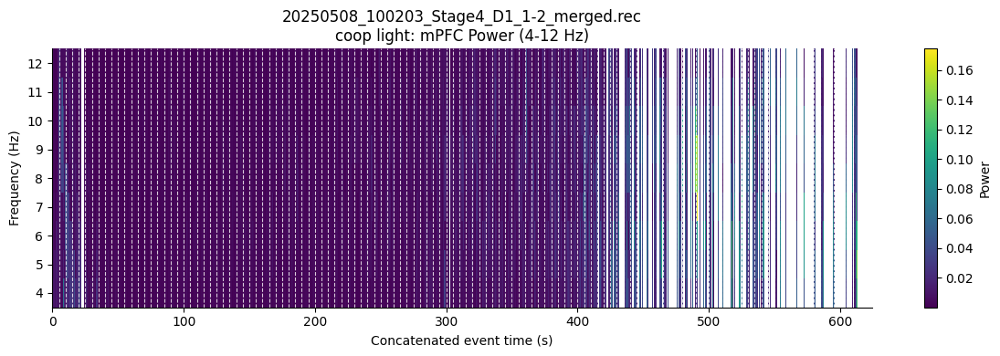

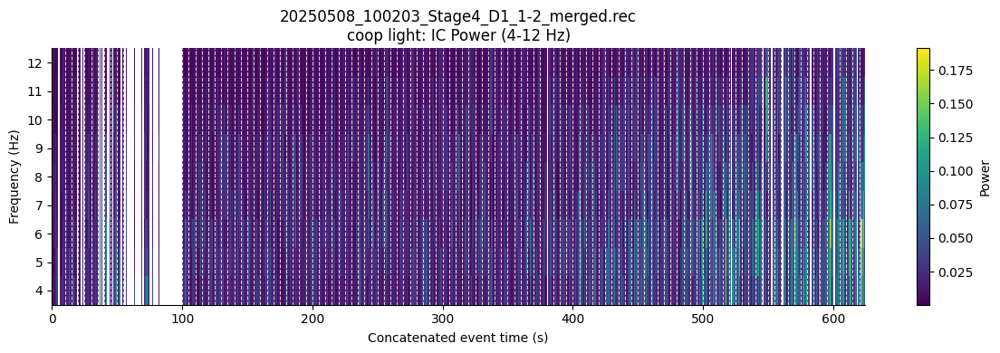

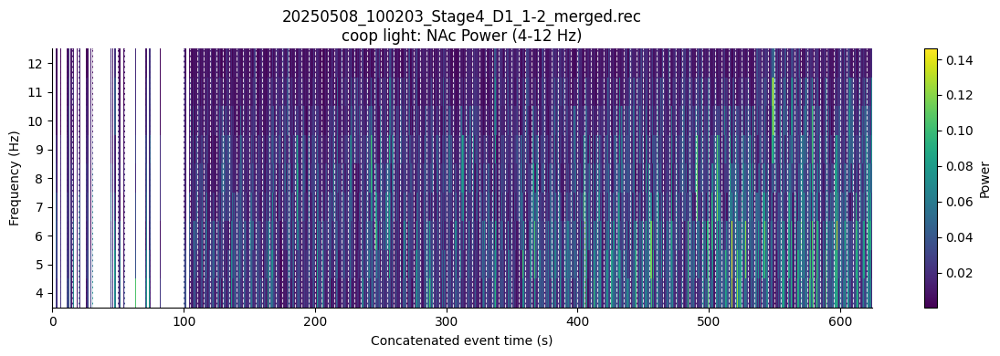

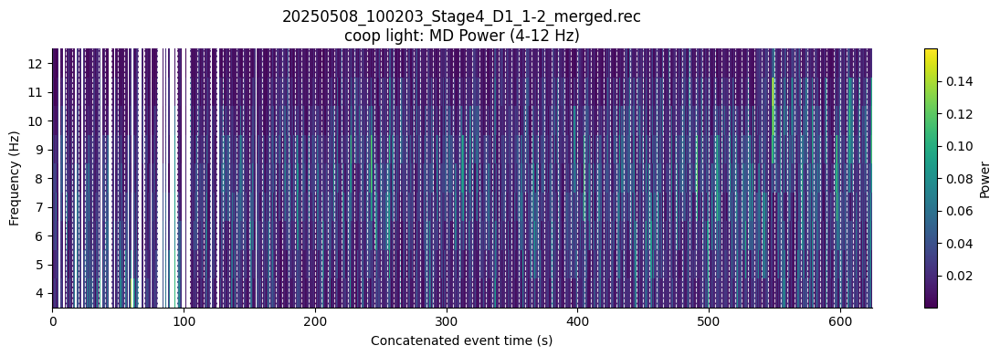

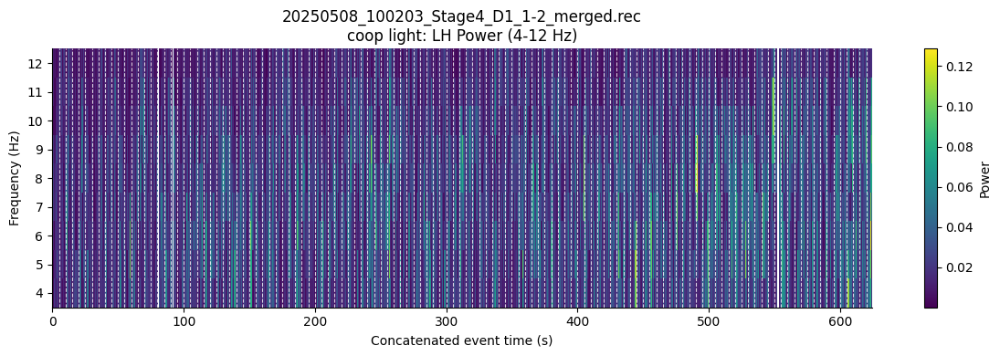

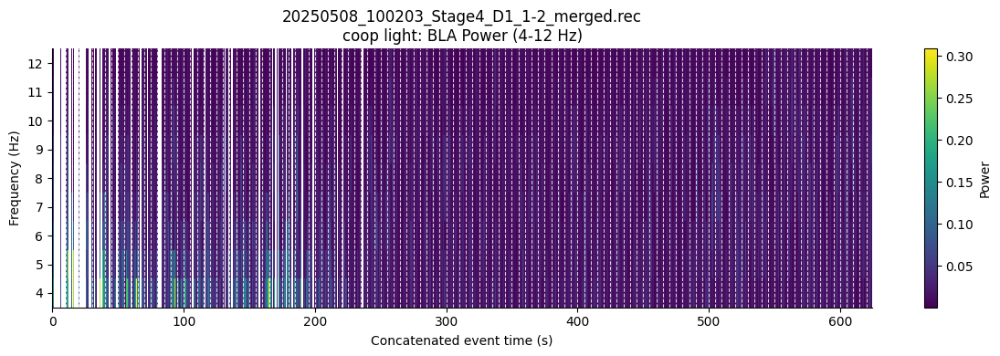

In [26]:
plot_recording_event_spectrogram(collection,
								 recording="20250508_100203_Stage4_D1_1-2_merged.rec",
								 event="coop light",
								 mode="power",
								 freq_range=(4, 12))

[<Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\n2s_windows: mPFC Power (4-12 Hz)'}, xlabel='Concatenated event time (s)', ylabel='Frequency (Hz)'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\n2s_windows: IC Power (4-12 Hz)'}, xlabel='Concatenated event time (s)', ylabel='Frequency (Hz)'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\n2s_windows: NAc Power (4-12 Hz)'}, xlabel='Concatenated event time (s)', ylabel='Frequency (Hz)'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\n2s_windows: MD Power (4-12 Hz)'}, xlabel='Concatenated event time (s)', ylabel='Frequency (Hz)'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\n2s_windows: LH Power (4-12 Hz)'}, xlabel='Concatenated event time (s)', ylabel='Frequency (Hz)'>,
 <Axes: title={'center': '20250508_100203_Stage4_D1_1-2_merged.rec\n2s_windows: BLA Power (4-12 Hz)'}, xlabel='Concatenated event time (s)', ylabel='Frequency (Hz)'>]

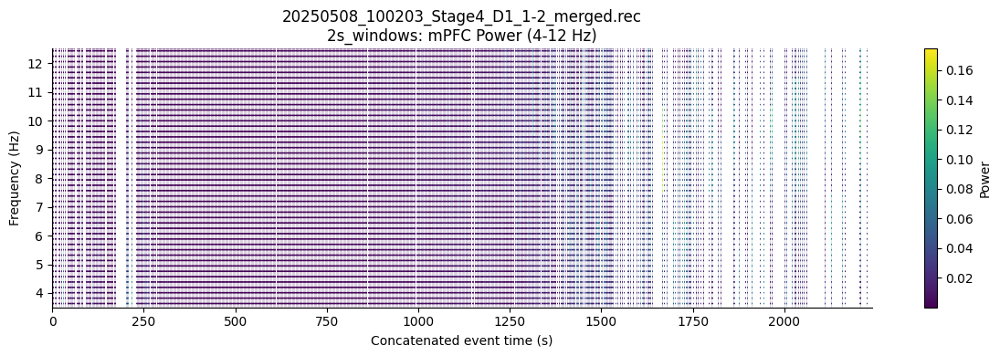

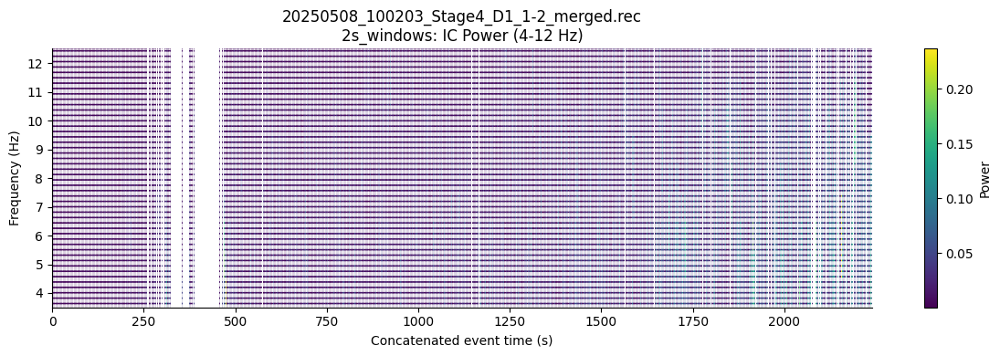

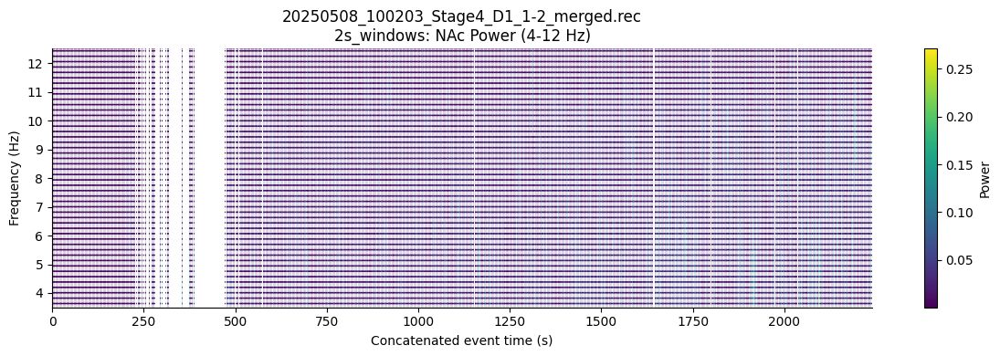

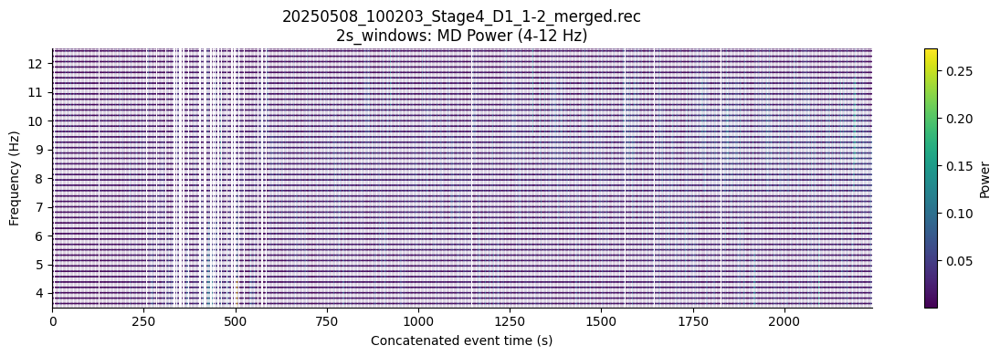

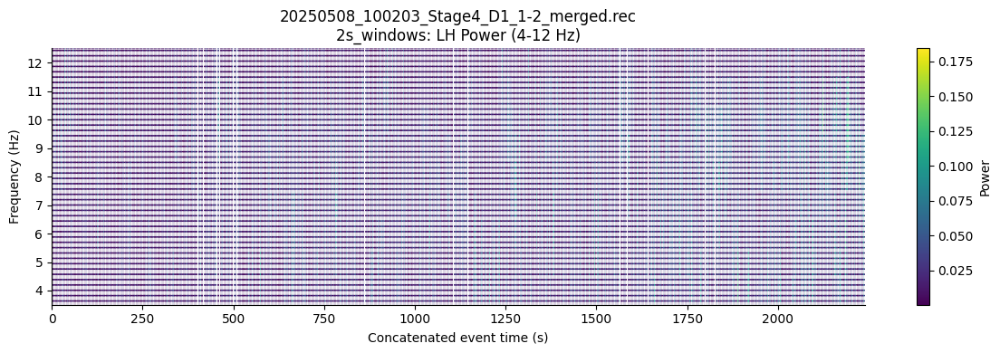

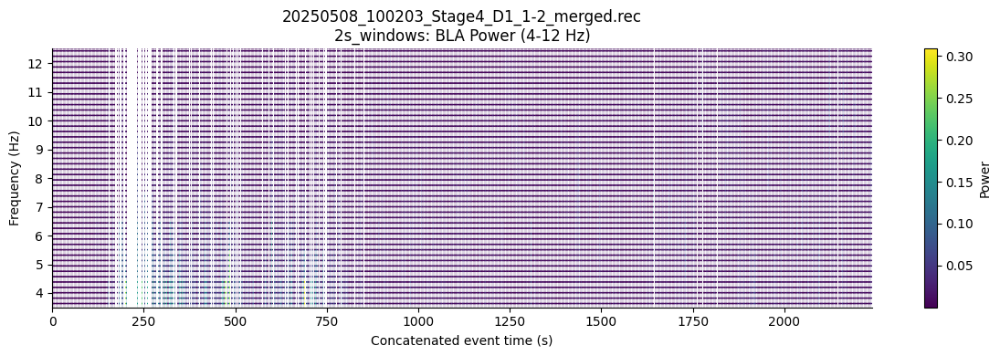

In [27]:
plot_recording_event_spectrogram(collection,
								 recording="20250508_100203_Stage4_D1_1-2_merged.rec",
								 event="2s_windows",
								 mode="power",
								 freq_range=(4, 12))